In [1]:
# this is for Airbnb boston data analysis and this work would be one of the outcome of the Udicity data scientist nanodegree project 

import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
from numpy.lib.histograms import histogram
from numpy import size
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error

In [2]:
listingsDf = pd.read_csv('C:/Users/Petar/Desktop/DataScience/Udacity/Project1/listingsBoston.csv')
calendarDf = pd.read_csv('C:/Users/Petar/Desktop/DataScience/Udacity/Project1/calendarBoston.csv')
reviewsDf = pd.read_csv('C:/Users/Petar/Desktop/DataScience/Udacity/Project1/reviewsBoston.csv')

# Getting to know the datasets

In [3]:
print("Shape of listings Boston:", listingsDf.shape)
print("Shape of calendar Boston", calendarDf.shape)
print("Shape of reviews Boston", reviewsDf.shape)


Shape of listings Boston: (3585, 95)
Shape of calendar Boston (1308890, 4)
Shape of reviews Boston (68275, 6)


Looking at null values

In [4]:
print("Columns in 'listingsDf'with only missing values:", set(listingsDf.columns[listingsDf.isnull().mean() == 1]))
print("Columns in 'calendarDf'with only missing values:", set(calendarDf.columns[calendarDf.isnull().mean() == 1]))
print("Columns in 'reviewsDf'with only missing values:", set(reviewsDf.columns[reviewsDf.isnull().mean() == 1]))

Columns in 'listingsDf'with only missing values: {'jurisdiction_names', 'license', 'neighbourhood_group_cleansed', 'has_availability'}
Columns in 'calendarDf'with only missing values: set()
Columns in 'reviewsDf'with only missing values: set()


In [5]:
#Dropping value with only null values
listingsDf = listingsDf.drop(['license', 'neighbourhood_group_cleansed', 'jurisdiction_names', 'has_availability'], axis=1)

In [6]:
#Check the percentage of missing values by columns in the dataset
print('Listings:\n', listingsDf.isnull().sum().sort_values(ascending=False)[:10] / listingsDf.shape[0])
print('\nCalendar: \n', calendarDf.isnull().sum().sort_values(ascending=False)[:5] / calendarDf.shape[0])
print('\nReview: \n', reviewsDf.isnull().sum().sort_values(ascending=False)[:10] / reviewsDf.shape[0])

Listings:
 square_feet              0.984379
monthly_price            0.752301
weekly_price             0.751185
security_deposit         0.625662
notes                    0.550907
interaction              0.433473
access                   0.415342
neighborhood_overview    0.394700
host_about               0.365132
transit                  0.359833
dtype: float64

Calendar: 
 price         0.508716
listing_id    0.000000
date          0.000000
available     0.000000
dtype: float64

Review: 
 comments         0.000776
listing_id       0.000000
id               0.000000
date             0.000000
reviewer_id      0.000000
reviewer_name    0.000000
dtype: float64


In [7]:
#describe
listingsDf.describe()

,id,scrape_id,host_id,host_listings_count,host_total_listings_count,latitude,longitude,accommodates,bathrooms,bedrooms,...,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,reviews_per_month
count,3.585000e+03,3.585000e+03,3.585000e+03,3585.000000,3585.000000,3585.000000,3585.000000,3585.000000,3571.000000,3575.000000,...,3585.000000,2772.000000,2762.000000,2767.000000,2765.000000,2767.000000,2763.000000,2764.000000,3585.000000,2829.000000
mean,8.440875e+06,2.016091e+13,2.492311e+07,58.902371,58.902371,42.340032,-71.084818,3.041283,1.221647,1.255944,...,19.044630,91.916667,9.431571,9.258041,9.646293,9.646549,9.414043,9.168234,12.733891,1.970908
std,4.500787e+06,0.000000e+00,2.292781e+07,171.119663,171.119663,0.024403,0.031565,1.778929,0.501487,0.753060,...,35.571658,9.531686,0.931863,1.168977,0.762753,0.735507,0.903436,1.011116,29.415076,2.120561
min,3.353000e+03,2.016091e+13,4.240000e+03,0.000000,0.000000,42.235942,-71.171789,1.000000,0.000000,0.000000,...,0.000000,20.000000,2.000000,2.000000,2.000000,4.000000,2.000000,2.000000,1.000000,0.010000
25%,4.679319e+06,2.016091e+13,6.103425e+06,1.000000,1.000000,42.329995,-71.105083,2.000000,1.000000,1.000000,...,1.000000,89.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,1.000000,0.480000
50%,8.577620e+06,2.016091e+13,1.928100e+07,2.000000,2.000000,42.345201,-71.078429,2.000000,1.000000,1.000000,...,5.000000,94.000000,10.000000,10.000000,10.000000,10.000000,10.000000,9.000000,2.000000,1.170000
75%,1.278953e+07,2.016091e+13,3.622147e+07,7.000000,7.000000,42.354685,-71.062155,4.000000,1.000000,2.000000,...,21.000000,98.250000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,6.000000,2.720000
max,1.493346e+07,2.016091e+13,9.385411e+07,749.000000,749.000000,42.389982,-71.000100,16.000000,6.000000,5.000000,...,404.000000,100.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,136.000000,19.150000


It is noticed that price variables are treated as strings as they begin with a '$'. They need to be converted into floats

In [8]:
listingsDf['price'] = listingsDf['price'].str.replace('$', '').str.replace(',', '')
listingsDf['price'] = listingsDf['price'].astype(float)

listingsDf['cleaning_fee'] = listingsDf['cleaning_fee'].str.replace('$', '').str.replace(',', '')
listingsDf['cleaning_fee'] = listingsDf['cleaning_fee'].astype(float)

listingsDf['weekly_price'] = listingsDf['weekly_price'].str.replace('$', '').str.replace(',', '')
listingsDf['weekly_price'] = listingsDf['weekly_price'].astype(float)

listingsDf['monthly_price'] = listingsDf['monthly_price'].str.replace('$', '').str.replace(',', '')
listingsDf['monthly_price'] = listingsDf['monthly_price'].astype(float)

listingsDf['security_deposit'] = listingsDf['security_deposit'].str.replace('$', '').str.replace(',', '')
listingsDf['security_deposit'] = listingsDf['security_deposit'].astype(float)

C:\Users\Petar\AppData\Local\Temp\ipykernel_29936\440252230.py:1: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  listingsDf['price'] = listingsDf['price'].str.replace('$', '').str.replace(',', '')
C:\Users\Petar\AppData\Local\Temp\ipykernel_29936\440252230.py:4: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  listingsDf['cleaning_fee'] = listingsDf['cleaning_fee'].str.replace('$', '').str.replace(',', '')
C:\Users\Petar\AppData\Local\Temp\ipykernel_29936\440252230.py:7: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  listings

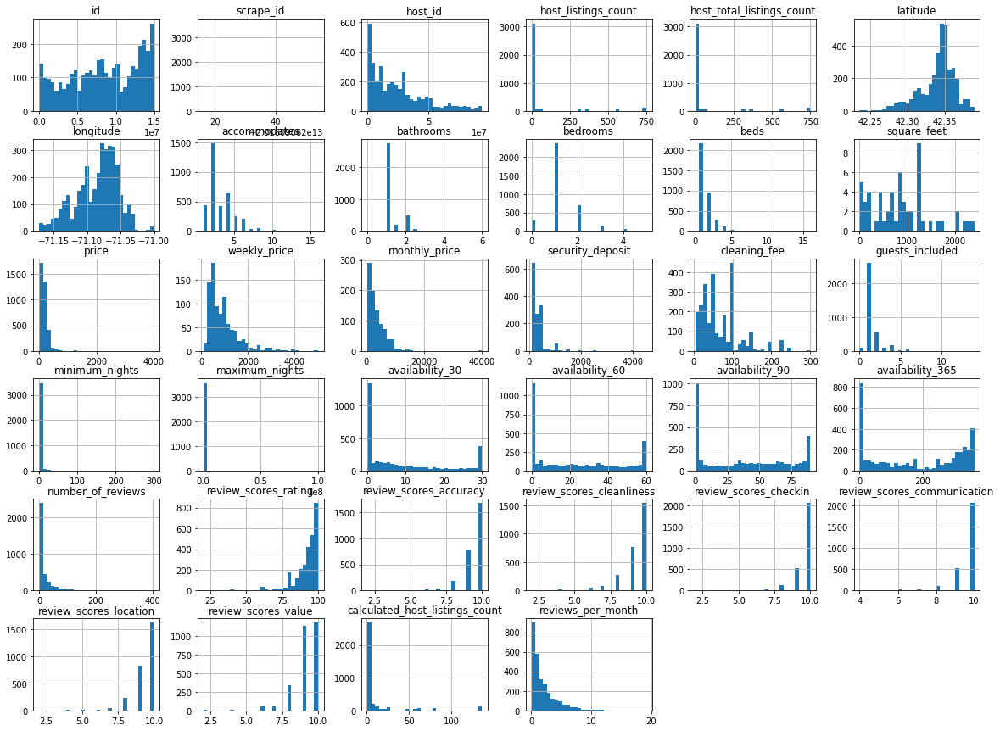

In [9]:
listingsDf.hist(figsize=[20,15], bins=30);

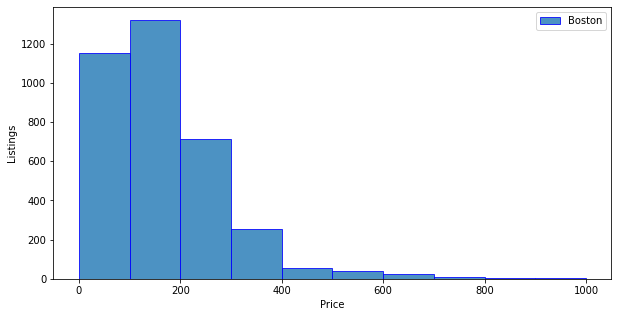

In [10]:
plt.figure(figsize=(10,5))

boston_price = listingsDf['price'].values.tolist()

plt.hist(boston_price, label='Boston', alpha=.8, edgecolor='blue', bins=10, range=(0,1000))
plt.xlabel("Price")
plt.ylabel("Listings")
plt.legend()

plt.show()

Analysing average prices per neighbourhood

In [11]:
neighbourhood_mean = listingsDf.groupby(['neighbourhood_cleansed']).mean()['price'].sort_values(ascending=False)
neighbourhood_mean

neighbourhood_cleansed
South Boston Waterfront    306.060241
Bay Village                266.833333
Leather District           253.600000
Back Bay                   240.950331
Downtown                   236.459302
Chinatown                  232.352113
Beacon Hill                224.443299
Fenway                     220.393103
West End                   209.591837
South End                  204.349693
Charlestown                198.045045
North End                  195.678322
South Boston               187.609195
Roxbury                    146.333333
Jamaica Plain              138.478134
Longwood Medical Area      138.444444
Mission Hill               121.967742
East Boston                119.153333
Brighton                   118.767568
Allston                    112.307692
West Roxbury               107.108696
Roslindale                  98.428571
Dorchester                  91.639405
Hyde Park                   86.548387
Mattapan                    75.125000
Name: price, dtype: float64

In [12]:
test_lst = neighbourhood_mean.keys().tolist()
test_lst

['South Boston Waterfront',
 'Bay Village',
 'Leather District',
 'Back Bay',
 'Downtown',
 'Chinatown',
 'Beacon Hill',
 'Fenway',
 'West End',
 'South End',
 'Charlestown',
 'North End',
 'South Boston',
 'Roxbury',
 'Jamaica Plain',
 'Longwood Medical Area',
 'Mission Hill',
 'East Boston',
 'Brighton',
 'Allston',
 'West Roxbury',
 'Roslindale',
 'Dorchester',
 'Hyde Park',
 'Mattapan']

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


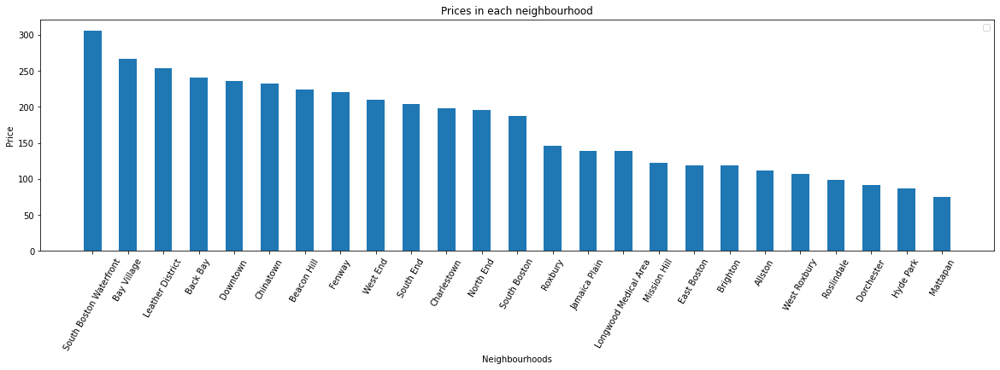

In [13]:
plt.figure(figsize=(20,5))

X = neighbourhood_mean.keys().tolist()
X_axis = np.arange(len(X))

plt.bar(X_axis, neighbourhood_mean, 0.5)


plt.xticks(X_axis, X, rotation=60)
plt.xlabel("Neighbourhoods")
plt.ylabel("Price")
plt.title("Prices in each neighbourhood")
plt.legend()
plt.show()

# Question 1
Which factors influience the price of houses the most in Boston

Manipulate the dataset

In [14]:
#selected adjectives
adj_lst = ['accessible', 'beautiful', 'best', 'better', 'brilliant', 'charming', 'cheap', 'cheerful', 'clean', 'comfortable', 'comfy',
            'connected', 'cosy', 'cozy', 'deluxe', 'desirable', 'elegant', 'excellent', 'favourite', 'fine', 'good', 'gorgeous', 'intimate',
            'large', 'nice', 'pretty', 'private', 'spacious', 'splendid', 'stylish', 'tidy', 'magnificent', 'delicious', 'decent', 'perfect',
            'positive', 'reasonable', 'tremendous', 'bright', 'modern', 'quiet' , 'multicultural', 'public transportation', 'easy access', 
            'shops', 'restaurants', 'welcoming', 'stores', 'shop', 'store', 'gem', 'cafes', 'transport', 'museum', 'family', 'bars', 'roommate',
            'pet', 'dog', 'cat', 'children', 'child', 'crazy', 'toddler', 'kid', 'parking', 'rail station', 'bus station', 'private bathroom',
            'kitchen', 'wifi', 'home office', 'professional', 'laid-back', 'busy', 'chat', 'large', 'sunny']


In [15]:
listingsDf['combinedString'] = listingsDf['name'].astype(str) + ', ' + listingsDf['summary'].astype(str) + ', ' + listingsDf['space'].astype(str) + ', ' + listingsDf['description'].astype(str) + ', '+ listingsDf['neighborhood_overview'].astype(str) + ', ' + listingsDf['notes'].astype(str) + ', ' + listingsDf['transit'].astype(str) + ', ' + listingsDf['interaction'].astype(str) 

Add key words from descriptive columns

In [16]:
for adj in adj_lst:
    listingsDf[adj] = 0
    for i in range(listingsDf.shape[0]):
        comb_str = listingsDf[['combinedString']].iloc[i]
        #replacing all the symbols in the string and making all the letters with lower case
        comb_str_lc = str(list(map(lambda x: x.lower(), comb_str))).replace(',', '').replace('"', '').replace('.', '').replace(':', '').replace('&', '').replace('-', '').replace('!', '').replace('(', '').replace(')', '')
        if adj in comb_str_lc:
            listingsDf[adj].iloc[i] = 1

C:\Users\Petar\AppData\Local\Temp\ipykernel_29936\2261726957.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  listingsDf[adj].iloc[i] = 1
C:\Users\Petar\AppData\Local\Temp\ipykernel_29936\2261726957.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  listingsDf[adj].iloc[i] = 1
C:\Users\Petar\AppData\Local\Temp\ipykernel_29936\2261726957.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  listingsDf[adj].iloc[i] = 1
C:\Users\Petar\A

In [17]:
dummy_col = ['cancellation_policy', 'bed_type', 'room_type', 'property_type', 'host_response_time','neighbourhood_cleansed','bedrooms']

for col in  dummy_col:
        #for each cat add dummy var, drop original column
        listingsDf = pd.concat([listingsDf.drop(col, axis=1), pd.get_dummies(listingsDf[col], prefix=col, prefix_sep='_', drop_first=True)], axis=1)

In [18]:
keep_col_list = []
keep_col_list = keep_col_list + listingsDf.select_dtypes(exclude='object').columns.tolist()

In [19]:
listings_q2 = listingsDf[keep_col_list]
listings_q2 = listings_q2.drop(['scrape_id', 'host_id', 'latitude', 'longitude'], axis=1)
listings_q2

,id,host_listings_count,host_total_listings_count,accommodates,bathrooms,beds,square_feet,price,weekly_price,monthly_price,...,neighbourhood_cleansed_South Boston,neighbourhood_cleansed_South Boston Waterfront,neighbourhood_cleansed_South End,neighbourhood_cleansed_West End,neighbourhood_cleansed_West Roxbury,bedrooms_1.0,bedrooms_2.0,bedrooms_3.0,bedrooms_4.0,bedrooms_5.0
0,12147973,1,1,4,1.5,3.0,NaN,250.0,NaN,NaN,...,0,0,0,0,0,0,1,0,0,0
1,3075044,1,1,2,1.0,1.0,NaN,65.0,400.0,NaN,...,0,0,0,0,0,1,0,0,0,0
2,6976,1,1,2,1.0,1.0,NaN,65.0,395.0,1350.0,...,0,0,0,0,0,1,0,0,0,0
3,1436513,1,1,4,1.0,2.0,NaN,75.0,NaN,NaN,...,0,0,0,0,0,1,0,0,0,0
4,7651065,1,1,2,1.5,2.0,NaN,79.0,NaN,NaN,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3580,8373729,28,28,3,1.0,1.0,NaN,69.0,NaN,NaN,...,0,0,0,0,0,1,0,0,0,0
3581,14844274,2,2,2,1.0,1.0,NaN,150.0,NaN,NaN,...,0,0,0,0,0,1,0,0,0,0
3582,14585486,1,1,4,1.0,1.0,NaN,198.0,NaN,NaN,...,0,0,0,0,0,1,0,0,0,0
3583,14603878,4,4,2,1.0,1.0,NaN,65.0,NaN,NaN,...,0,0,0,0,0,1,0,0,0,0


In [20]:
most_infl_s = listings_q2.corr()['price'].sort_values(ascending = False)[1:]

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


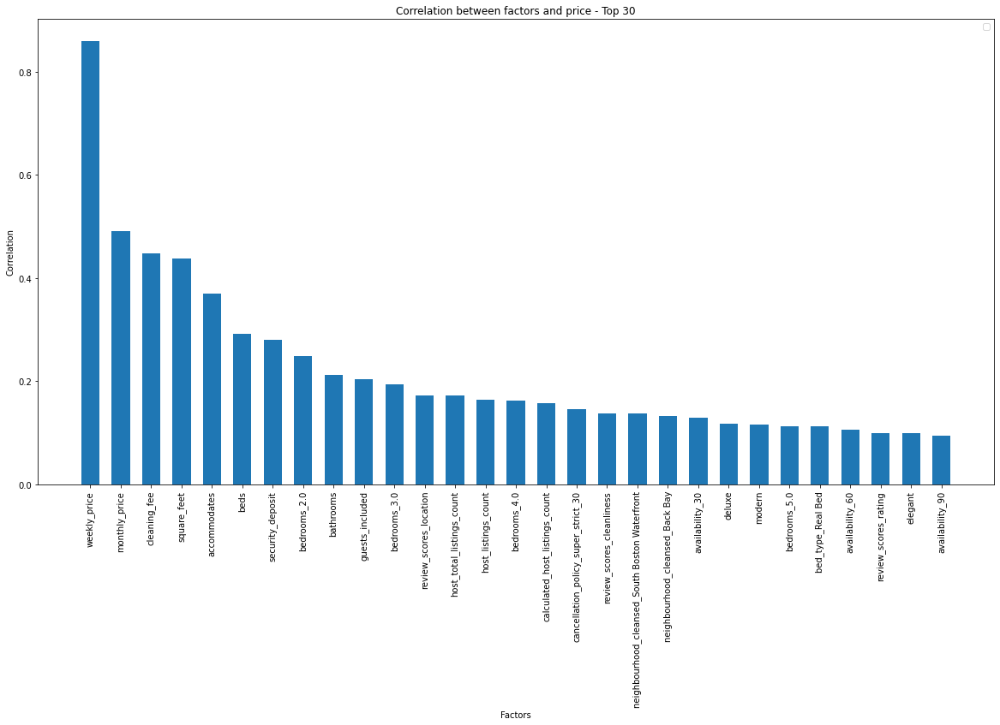

In [21]:
plt.figure(figsize=(20,10))

X = most_infl_s[:30].keys().tolist()
X_axis = np.arange(29)
plt.bar(X_axis, most_infl_s[1:30], 0.6)

plt.xticks(X_axis[:30], X[:29], rotation=90)
plt.xlabel("Factors")
plt.ylabel("Correlation")
plt.title("Correlation between factors and price - Top 30")
plt.legend()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


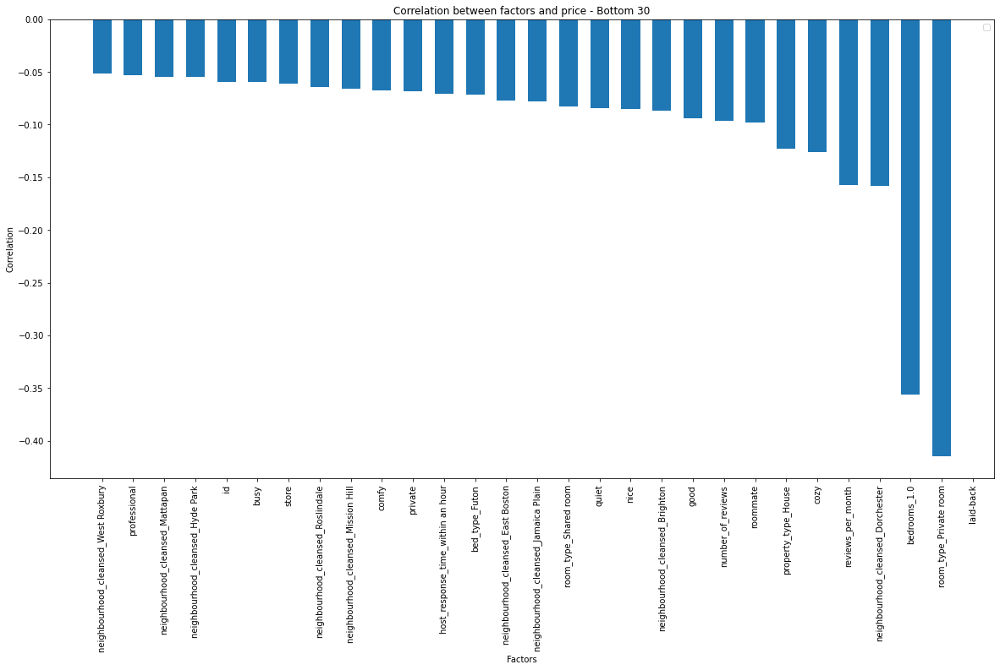

In [22]:
plt.figure(figsize=(20,10))

X = most_infl_s[-30:].keys().tolist()
X_axis = np.arange(29)
plt.bar(X_axis, most_infl_s[-29:], 0.6)

plt.xticks(X_axis, X[-29:], rotation=90)
plt.xlabel("Factors")
plt.ylabel("Correlation")
plt.title("Correlation between factors and price - Bottom 30")
plt.legend()
plt.show()

# Question 2
Find if there are differences in words which might reflect the difference in price between neighbourhoods

# Question 3
Find the best and worst listed deals

Deal with NA values

In [23]:
#Check if there are the missing values
listings_q2.isnull().mean().sort_values(ascending=False)[:20]

square_feet                            0.984379
monthly_price                          0.752301
weekly_price                           0.751185
security_deposit                       0.625662
cleaning_fee                           0.308787
review_scores_accuracy                 0.229568
review_scores_location                 0.229289
review_scores_value                    0.229010
review_scores_checkin                  0.228731
review_scores_communication            0.228173
review_scores_cleanliness              0.228173
review_scores_rating                   0.226778
reviews_per_month                      0.210879
bathrooms                              0.003905
beds                                   0.002510
cancellation_policy_super_strict_30    0.000000
cancellation_policy_strict             0.000000
bed_type_Couch                         0.000000
bed_type_Futon                         0.000000
room_type_Shared room                  0.000000
dtype: float64

In [24]:
#Drop square feet from the table as it is not present in 98% of the rows and there are other indicators like accommodates which serve a similar role
listings_q3 = listings_q2.drop(['square_feet'], axis=1)

In [26]:
#Fill listed columns with 0s as NA values probably indicate that service is not present
na_zero_cols = ['monthly_price', 'weekly_price', 'security_deposit', 'cleaning_fee', 'reviews_per_month', 'bathrooms', 'beds', 'host_listings_count', 'host_total_listings_count']
#listings_q3[na_zero_cols] = listings_q3[na_zero_cols].fillna(0)

#Fill rest of values with the column mean
#listings_q3.fillna(listings_q3.median(), inplace=True)
#listings_q3 = listings_q3.dropna(axis=0)
listings_q3 = listings_q3.drop(na_zero_cols, axis=1)
listings_q3 = listings_q3.fillna(0)


In [ ]:
listings_q3 = listings_q3.drop(set(listings_q3.columns[listings_q3.isnull().mean()>0]),axis=1)

In [27]:
listings_q3

,id,accommodates,price,guests_included,minimum_nights,maximum_nights,availability_30,availability_60,availability_90,availability_365,...,neighbourhood_cleansed_South Boston,neighbourhood_cleansed_South Boston Waterfront,neighbourhood_cleansed_South End,neighbourhood_cleansed_West End,neighbourhood_cleansed_West Roxbury,bedrooms_1.0,bedrooms_2.0,bedrooms_3.0,bedrooms_4.0,bedrooms_5.0
0,12147973,4,250.0,1,2,1125,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
1,3075044,2,65.0,0,2,15,26,54,84,359,...,0,0,0,0,0,1,0,0,0,0
2,6976,2,65.0,1,3,45,19,46,61,319,...,0,0,0,0,0,1,0,0,0,0
3,1436513,4,75.0,2,1,1125,6,16,26,98,...,0,0,0,0,0,1,0,0,0,0
4,7651065,2,79.0,1,2,31,13,34,59,334,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3580,8373729,3,69.0,1,2,1125,21,51,81,356,...,0,0,0,0,0,1,0,0,0,0
3581,14844274,2,150.0,1,3,365,29,59,89,364,...,0,0,0,0,0,1,0,0,0,0
3582,14585486,4,198.0,1,3,12,0,15,40,40,...,0,0,0,0,0,1,0,0,0,0
3583,14603878,2,65.0,1,1,13,5,5,5,253,...,0,0,0,0,0,1,0,0,0,0


In [28]:
#Split into explanatory and response variables
X = listings_q3.drop(['price'], axis=1)
y = listings_q3['price']

#Split into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=42)

lm_model = LinearRegression(normalize=True) # Instantiate
lm_model.fit(X_train, y_train) #Fit

#Predict using your model
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)

#Score using your model
test_score = r2_score(y_test, y_test_preds)
train_score = r2_score(y_train, y_train_preds)

print('The test score is: ', '{:.3f}'.format(test_score))
print('The train score is: ', '{:.3f}'.format(train_score))

The test score is:  0.225
The train score is:  0.460


c:\Programs\Python\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)


  warnings.warn(


In [ ]:
X_test['pred_price'] = lm_model.predict(X_test)
X_train['pred_price'] = lm_model.predict(X_train)

In [ ]:
X_test

,id,host_listings_count,host_total_listings_count,accommodates,bathrooms,beds,weekly_price,monthly_price,security_deposit,cleaning_fee,...,neighbourhood_cleansed_South Boston Waterfront,neighbourhood_cleansed_South End,neighbourhood_cleansed_West End,neighbourhood_cleansed_West Roxbury,bedrooms_1.0,bedrooms_2.0,bedrooms_3.0,bedrooms_4.0,bedrooms_5.0,pred_price
3163,4928894,1,1,2,1.0,1.0,0.0,0.0,100.0,30.0,...,0,0,0,0,1,0,0,0,0,176.459401
3133,5511924,1,1,2,1.0,1.0,0.0,0.0,0.0,45.0,...,0,0,0,0,1,0,0,0,0,117.455998
937,13995573,4,4,8,2.0,4.0,0.0,0.0,500.0,150.0,...,0,1,0,0,0,0,1,0,0,362.294223
196,3616081,2,2,3,1.0,2.0,998.0,0.0,200.0,45.0,...,0,0,0,0,1,0,0,0,0,115.996374
2852,11021254,0,0,2,1.0,1.0,0.0,0.0,0.0,25.0,...,0,0,0,0,1,0,0,0,0,75.988859
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
288,12849003,1,1,2,1.0,1.0,0.0,0.0,0.0,25.0,...,0,0,0,0,1,0,0,0,0,56.189737
2815,13564762,22,22,1,1.0,1.0,0.0,0.0,500.0,50.0,...,0,0,0,0,1,0,0,0,0,27.445177
2374,8099266,749,749,3,1.0,1.0,0.0,6789.0,0.0,100.0,...,0,0,0,0,1,0,0,0,0,205.646017
2923,14918425,2,2,9,1.0,5.0,0.0,0.0,100.0,75.0,...,0,0,0,0,0,0,1,0,0,262.535242
